# Classification

Let's try to do some classification.

In [28]:
%matplotlib inline
import matplotlib.pylab as plt
import IPython.display as ipd
import numpy as np
import pandas as pd
import scipy
import sklearn
import librosa
import librosa.display
from ast import literal_eval

np.random.seed(37)

# Read in the CSV

You've got to run the `explore-data.ipynb` which exports the file `recording.csv`. 

In [29]:
recording_df = pd.read_csv('recording.csv', converters={'types': literal_eval})

In [30]:
recording_df.head(5)

,id,state,en,sp,ssp,gen,lat,lng,types,mp3,mp3_size,duration
0,135670,tennessee,red-headed woodpecker,erythrocephalus,NaN,melanerpes,35.386,-84.125,[song],./mp3/135670.mp3,296091,18.249688
1,109610,tennessee,red-headed woodpecker,erythrocephalus,NaN,melanerpes,35.386,-84.125,"[begging call, call, juvenile]",./mp3/109610.mp3,1261252,78.572250
2,109609,tennessee,red-headed woodpecker,erythrocephalus,NaN,melanerpes,35.386,-84.125,[call],./mp3/109609.mp3,388080,23.999000
3,109608,tennessee,red-headed woodpecker,erythrocephalus,NaN,melanerpes,35.386,-84.125,[call],./mp3/109608.mp3,452863,28.047938
4,105601,NaN,red-headed woodpecker,erythrocephalus,NaN,melanerpes,38.140,-98.479,[call],./mp3/105601.mp3,690469,42.945306


# Determine the classes

Let's see which classes will be good for testing classification. Here, we will use the `species name` as the class labels. However, we will only choose 2 classes to do this simple binary classification exercise. By sheer luck, the `wollweberi` and `quiscula` species have exactly 100 samples each. We will take `wollweberi` as the `0` class and `quiscula` as the `1` class. Note that we only look at samples according to the following criteria.

* sample must be a `call` or `song`
* sample must be less than 60 seconds
* sample must be less than 1 MB

In [31]:
s = recording_df[recording_df['sp'].notnull()]['sp'].value_counts()

In [32]:
s[s == 100]

wollweberi    100
quiscula      100
Name: sp, dtype: int64

In [53]:
def filter_row(r):
    if 'call' in r['types'] or 'song' in r['types']:
        if 'wollweberi' == r['sp'] or 'quiscula' == r['sp']:
            if 0 < r['duration'] <= 60.0:
                if 0 < r['mp3_size'] / float(1024 * 1024) <= 1.0:
                    return True
    return False

samples_df = recording_df[recording_df.apply(lambda r: filter_row(r), axis=1)]

In [54]:
samples_df['sp'].value_counts()

wollweberi    79
quiscula      54
Name: sp, dtype: int64

# Plot some spectrograms

In [70]:
def show_audio(df):
    for i in range(10):
        r = df.iloc[i]
        fname = r['mp3']
        gen = r['gen']
        sp = r['sp']
        title = '{}, {}, {}'.format(gen, sp, fname)
        y, sr = librosa.load(fname)
        
        ipd.display(ipd.Audio(fname))

def plot_melspectrogram(df):
    fig, ax = plt.subplots(5, 2, figsize=(15, 10), sharex=False, sharey=False)
    for i, axis in enumerate(np.ravel(ax)):
        r = df.iloc[i]
        fname = r['mp3']
        gen = r['gen']
        sp = r['sp']
        title = '{}, {}, {}'.format(gen, sp, fname)
        y, sr = librosa.load(fname)
        
        S = librosa.feature.melspectrogram(y, sr=sr, n_fft=2048, hop_length=512)
        logS = librosa.amplitude_to_db(S)
        librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='mel', ax=axis)
        
        axis.set_title(title)
    plt.tight_layout()

## Wollweberi spectrograms

In [71]:
show_audio(samples_df.query("sp == 'wollweberi'"))

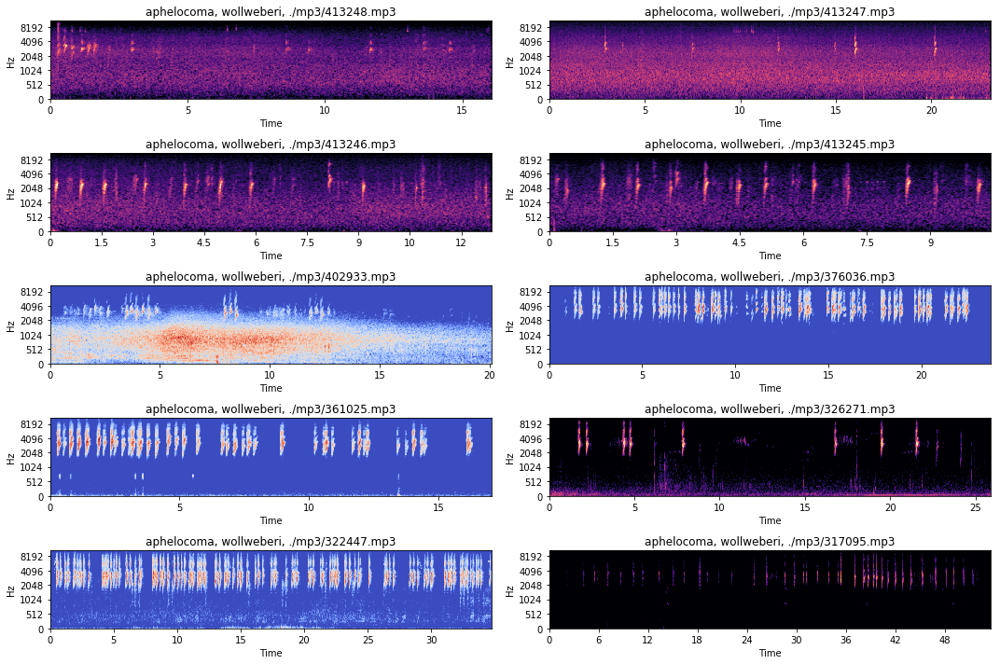

In [63]:
plot_melspectrogram(samples_df.query("sp == 'wollweberi'"))

## Quiscula spectrograms

In [72]:
show_audio(samples_df.query("sp == 'quiscula'"))

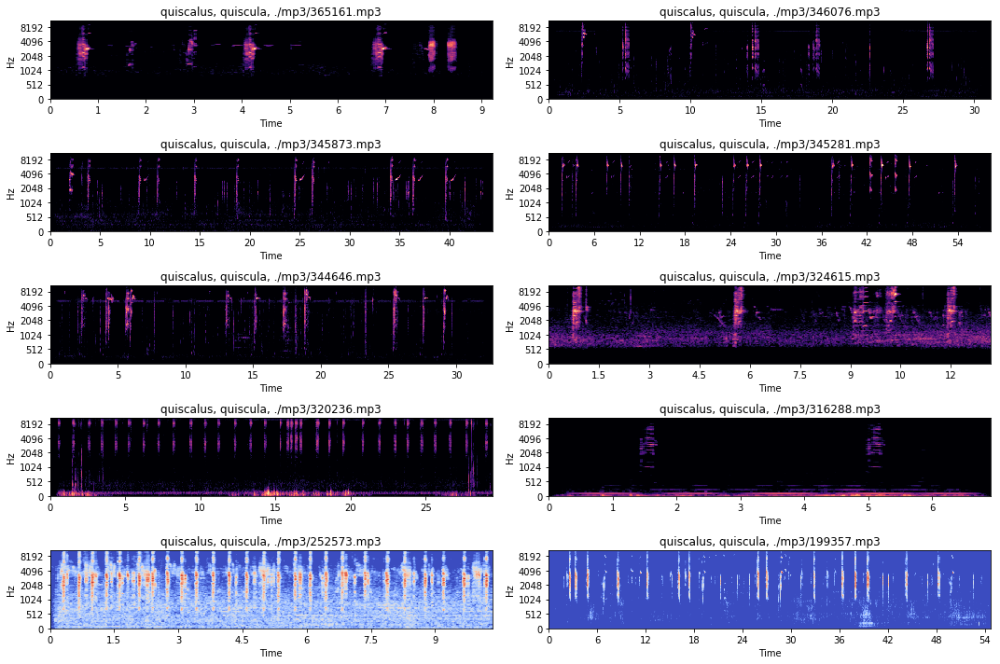

In [61]:
plot_melspectrogram(samples_df.query("sp == 'quiscula'"))